#Using ResNet152v2

In [1]:
path = 'AnimalDataset/AnimalDataset/raw-img'

In [2]:
import os
class_names = sorted(os.listdir(path))
n_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {n_classes}")

Class Names: 
['Butterfly', 'Cat', 'Cow', 'Dog', 'Hen']
Total Number of Classes : 5


In [3]:
class_dis = [len(os.listdir(path + f"/{name}")) for name in class_names]
print(f"Class Distribution : \n{class_dis}")

Class Distribution : 
[2113, 1668, 1866, 4863, 3098]


# Categorywise Dataset Visualization Using Pie Chart

In [20]:
pip install --upgrade plotly

Requirement already up-to-date: plotly in /workspace/envnam/lib/python3.8/site-packages (5.20.0)
Note: you may need to restart the kernel to use updated packages.


In [6]:
import plotly.express as px
fig = px.pie(names=class_names, values=class_dis, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()
print(fig)

Figure({
    'data': [{'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
              'hovertemplate': 'label=%{label}<br>value=%{value}<extra></extra>',
              'labels': array(['Butterfly', 'Cat', 'Cow', 'Dog', 'Hen'], dtype=object),
              'legendgroup': '',
              'name': '',
              'showlegend': True,
              'type': 'pie',
              'values': array([2113, 1668, 1866, 4863, 3098])}],
    'layout': {'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'title': {'text': 'Class Distribution', 'x': 0.5},
               'width': 600}
})


# Data Augmentation

In [4]:
# import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
import  matplotlib.pyplot as plt
import numpy as np

In [5]:
# Initialize Generator, to preprocess and augment image data for training and validation.
generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2
)


# Loads the training data from the specified directory and preprocesses it using the ImageDataGenerator object
train_ds = generator.flow_from_directory(
    path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='training')

# loads the validation data from the specified directory and preprocesses it using the ImageDataGenerator object.
valid_ds = generator.flow_from_directory(
    path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='validation')

Found 10889 images belonging to 5 classes.
Found 2719 images belonging to 5 classes.


In [6]:
def show_image(img, title=None):
    '''The function takes in a Image and plots it'''
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

In [7]:
def get_random_data(data):
    '''The function gets random image and label from the input data'''
    images, labels = data
    id = np.random.randint(len(images))
    image, label = images[id], labels[id]
    return image, label

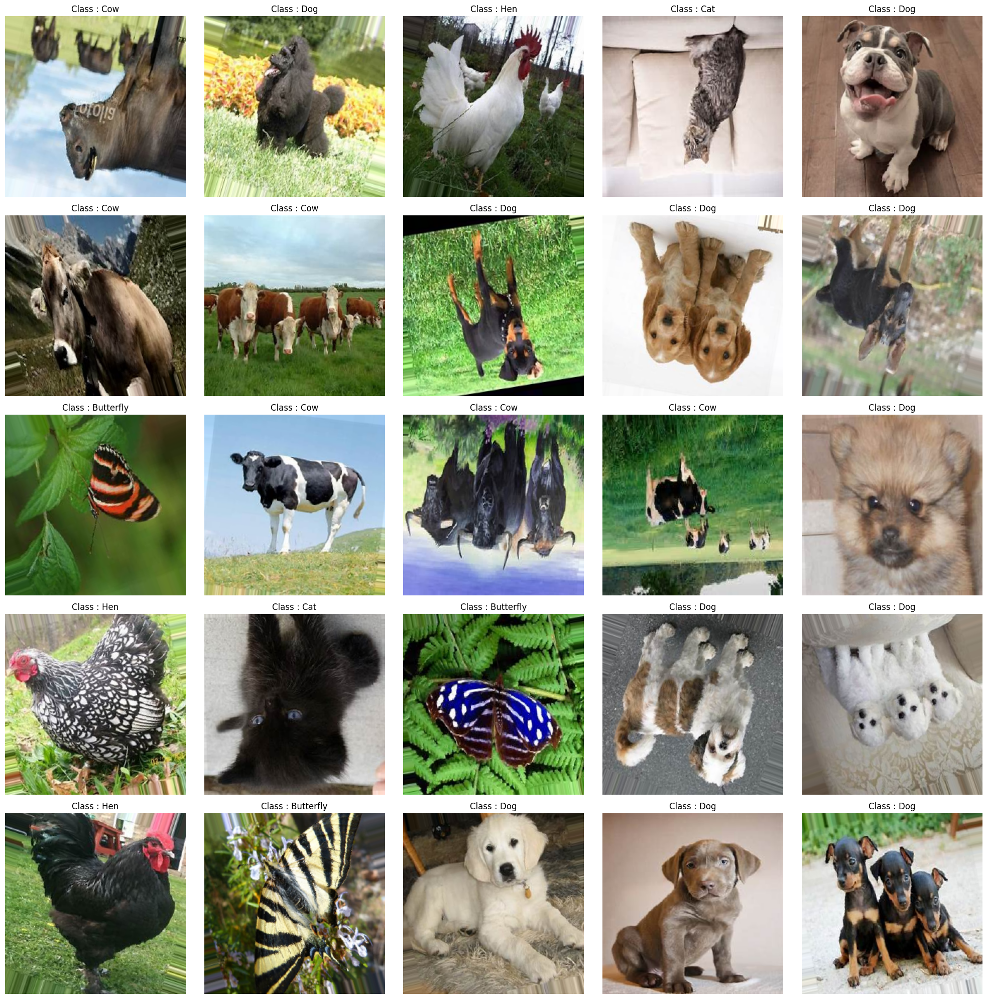

In [11]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(train_ds):

    # Get Random Image and label
    image, label = get_random_data([images, labels])

    # Plot it
    plt.subplot(5,5,i)
    show_image(image, title=f"Class : {class_names[int(label)]}")

    # Make sure to end the Loop
    i+=1
    if i>=26: break


plt.tight_layout()
plt.show()

In [ ]:
from tensorflow.keras.applications import ResNet152V2
from keras import Sequential
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout

'''
include_top: This parameter specifies whether or not to include the fully-connected layer at the top of the network. 
If include_top=True, the model will include the fully-connected layer, which is used for classification. 
If include_top=False, the model will not include the fully-connected layer, which means that you will need to add your own fully-connected layer to the top of the model. 
The default value for include_top is True.
'''
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False # Freeze the Weights

# Model
name = "ResNet152V2"
resnet152V2 = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(n_classes, activation='softmax')
], name=name)


# Compile


In [1]:
resnet152V2.compile(
   loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
    )

NameError: name 'resnet152V2' is not defined

from keras.callbacks import ModelCheckpoint, EarlyStopping
cbs = [
   EarlyStopping(patience=3, restore_best_weights=True),
   ModelCheckpoint(name + ".h5", save_best_only=True)
 ]

# Model Summary

In [16]:
resnet152V2.summary()

In [9]:
import tqdm

In [10]:
history = resnet152V2.fit(
        train_ds, 
        validation_data=valid_ds,
        epochs=5,  # Train for 1 epoch at a time
        callbacks=cbs,
    )

# Load the Model 

In [12]:
from tensorflow.keras.models import load_mode

In [14]:
model  = load_model("ResNet152V2.h5")

In [ ]:
#import visualkeras
visualkeras.layered_view(model).show()                        # display using your system viewer
visualkeras.layered_view(model, to_file='output.png')         # write to disk
visualkeras.layered_view(model, to_file='output.png').show()  # write and show
visualkeras.layered_view(model)

# Test the Model

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet_v2 import preprocess_input, decode_predictions
from tensorflow.keras.models import load_model

In [ ]:
# Load and preprocess an example image for prediction
image_path = 'TestImages/colorful-butterfly-pictures.jpg'

# load the image from target path and resize it to the target size
img = image.load_img(image_path, target_size=(256, 256))  
# convert the image to numpy array
img_array = image.img_to_array(img)
print(f'Image Shape before expanding dimensions: {img_array.shape}')
# adds an extra dimension to the array at specified axis, usually done to convert single image to batch of image
img_array = np.expand_dims(img_array, axis=0)
print(f'Image Shape after expanding dimensions: {img_array.shape}')
# preprocess the input according to theresnet_
img_array = preprocess_input(img_array)


In [ ]:
prediction = model.predict(img_array)
print(prediction)
# print(prediction.shape)

In [ ]:
class_labels = {0: 'Butterfly', 1: 'Cat', 2: 'Cow', 3: 'Dog', 4: 'Hen'}

# Get the top predicted class index
predicted_class_index = np.argmax(prediction)

# Map the class index to the corresponding label
predicted_class_label = class_labels[predicted_class_index]

# Print the predicted class label
print(f"Predicted Class: {predicted_class_label}")

# Visualize the validation and Training Error 

In [ ]:
# Plot training and validation loss
plt.plot(history.['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [ ]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
# loss, accuracy = model.evaluate(test_ds)
# print('Test Loss:', loss)
# print('Test Accuracy:', accuracy)

# Make predictions on the test data
predictions = model.predict(test_ds)
prediction = np.argmax(predictions, axis=1)
print(prediction.shape)
print(prediction[7])

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
conf_matrix = confusion_matrix(true_labels, prediction)
conf_matrix

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model = tf.keras.models.load_model('ResNet152V2.h5')

In [ ]:
model.summary()

In [ ]:
# Load your trained model
custom_objects = {'BatchNormalization': tf.keras.layers.BatchNormalization}
model = tf.keras.models.load_model('ResNet152V2.h5', compile=False, custom_objects=custom_objects)

In [ ]:
model = tf.keras.models.load_model('ResNet152V2.h5')

In [15]:
img_path = "TestAnimalDataset/TestAnimalDataset/Butterfly/butterfly.jpeg"

In [16]:
# load the image from target path and resize it to the target size
img = image.load_img(image_path, target_size=(256, 256))  
# convert the image to numpy array
img_array = image.img_to_array(img)
print(f'Image Shape before expanding dimensions: {img_array.shape}')
# adds an extra dimension to the array at specified axis, usually done to convert single image to batch of image
img_array = np.expand_dims(img_array, axis=0)
print(f'Image Shape after expanding dimensions: {img_array.shape}')
# preprocess the input according to theresnet_
img_array = preprocess_input(img_array)

NameError: name 'image' is not defined

In [ ]:
model.predict(img_array )

In [ ]:
model.summary()

In [ ]:
print(tf.__version__)